In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="0"

import pandas as pd
import numpy as np
import seaborn as sns
import gensim
import nltk
import spacy
import re
import spacy
import matplotlib.pyplot as plt

from sentence_transformers import SentenceTransformer, util
from ydata_profiling import ProfileReport
from nltk.corpus import stopwords
from wordcloud import WordCloud, STOPWORDS
from nltk import tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import f1_score, confusion_matrix, precision_score, recall_score, roc_auc_score, roc_curve
from sklearn.preprocessing import StandardScaler
from IPython.display import Image
from spacy import displacy
from transformers import pipeline
from urllib.parse import urlparse
from tqdm import tqdm
%matplotlib inline

# Agenda

We will follow classical flow for solving [Kaggle](https://www.kaggle.com/) tasks

1. [Problem Statement](#Problem_Statement)
2. [Exploratory Data Analysis + Metric](#EDA_Metric)
3. [Validation Scheme](#Validation_Scheme)
4. [ML Baseline](#ML_Baseline)
5. To be continued in the next lecture!

<a id='Problem_Statement'></a>
# Problem Statement

We will take [WELFake](https://www.kaggle.com/datasets/saurabhshahane/fake-news-classification/data)

You can find detailed information about the dataset in [paper](https://ieeexplore.ieee.org/document/9395133)

We will solve the binary classification task in order to detect fake news. 

We will use [F1 metric](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.f1_score.html) as the main metric and track [Roc Auc](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html) to compare models more effectively. 


In [2]:
dataset = pd.read_csv("../../data/fake_news_classification/WELFake_Dataset.csv").drop(columns="Unnamed: 0").rename(columns={"label": "is_fake"})

In [3]:
dataset.head()

,title,text,is_fake
0,LAW ENFORCEMENT ON HIGH ALERT Following Threat...,No comment is expected from Barack Obama Membe...,1
1,NaN,Did they post their votes for Hillary already?,1
2,UNBELIEVABLE! OBAMA’S ATTORNEY GENERAL SAYS MO...,"Now, most of the demonstrators gathered last ...",1
3,"Bobby Jindal, raised Hindu, uses story of Chri...",A dozen politically active pastors came here f...,0
4,SATAN 2: Russia unvelis an image of its terrif...,"The RS-28 Sarmat missile, dubbed Satan 2, will...",1


<a id='EDA_Metric'></a>
# Exploratory Data Analysis + Metric

## EDA — Exploratory Data Analysis

Involves using graphics and visualizations to explore and analyze a data set. The goal is to explore, investigate and learn, as opposed to confirming statistical hypotheses. 

We will mostly follow pipeline from [1st Lecture of NLP course](https://github.com/VSydorskyy/iasa_nlp_course/blob/v2023_autumn_iasa/Lecture_1/Formalization_of_Ml_task.ipynb)

In [4]:
profile = ProfileReport(dataset, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
# Check if there is rows with any text information

print("All NaN: ", (dataset["text"].isna() & dataset["title"].isna()).sum())

All NaN:  0


In [6]:
dataset["title"] = dataset["title"].fillna("")
dataset["text"] = dataset["text"].fillna("")

> **TODO**: Check out https://www.kaggle.com/datasets/saurabhshahane/fake-news-classification/code and find other preprocessing approaches

In [7]:
nltk.download('stopwords')

stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])
def preprocess_hard(text, join_back=True):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        # Stop Words Cleaning
        if (
            token not in gensim.parsing.preprocessing.STOPWORDS and 
            # len(token) > 2 and 
            token not in stop_words
        ):
            result.append(token)
    if join_back:
        result = " ".join(result)
    return result

[nltk_data] Downloading package stopwords to /home/vova/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


> **TODO**: Try to get rid of some preporcessing or add something

In [8]:
nltk.download('punkt')

def collapse_dots(input):
    # Collapse sequential dots
    input = re.sub("\.+", ".", input)
    # Collapse dots separated by whitespaces
    all_collapsed = False
    while not all_collapsed:
        output = re.sub(r"\.(( )*)\.", ".", input)
        all_collapsed = input == output
        input = output
    return output

# Check how it will influence different ML models
def process_light(input):
    if isinstance(input, str):
        input = " ".join(tokenize.sent_tokenize(input))
        input = re.sub(r"http\S+", "", input)
        input = re.sub(r"\n+", ". ", input)
        for symb in ["!", ",", ":", ";", "?"]:
            input = re.sub(rf"\{symb}\.", symb, input)
        input = re.sub("[^а-яА-Яa-zA-Z0-9!\"#$%&'()*+,-./:;<=>?@[\\]^_`{|}~ё]+", " ", input)
        input = re.sub(r"#\S+", "", input)
        input = collapse_dots(input)
        input = input.strip()
        # input = input.lower()
    return input

[nltk_data] Downloading package punkt to /home/vova/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [9]:
dataset["hard_clean_title"] = dataset["title"].apply(preprocess_hard)
dataset["hard_clean_text"] = dataset["text"].apply(preprocess_hard)

dataset["light_clean_title"] = dataset["title"].apply(process_light)
dataset["light_clean_text"] = dataset["text"].apply(process_light)

In [10]:
dataset.head()

,title,text,is_fake,hard_clean_title,hard_clean_text,light_clean_title,light_clean_text
0,LAW ENFORCEMENT ON HIGH ALERT Following Threat...,No comment is expected from Barack Obama Membe...,1,law enforcement high alert following threats c...,comment expected barack obama members fyf fuky...,LAW ENFORCEMENT ON HIGH ALERT Following Threat...,No comment is expected from Barack Obama Membe...
1,,Did they post their votes for Hillary already?,1,,post votes hillary,,Did they post their votes for Hillary already?
2,UNBELIEVABLE! OBAMA’S ATTORNEY GENERAL SAYS MO...,"Now, most of the demonstrators gathered last ...",1,unbelievable obama attorney general says charl...,demonstrators gathered night exercising consti...,UNBELIEVABLE! OBAMA S ATTORNEY GENERAL SAYS MO...,"Now, most of the demonstrators gathered last n..."
3,"Bobby Jindal, raised Hindu, uses story of Chri...",A dozen politically active pastors came here f...,0,bobby jindal raised hindu uses story christian...,dozen politically active pastors came private ...,"Bobby Jindal, raised Hindu, uses story of Chri...",A dozen politically active pastors came here f...
4,SATAN 2: Russia unvelis an image of its terrif...,"The RS-28 Sarmat missile, dubbed Satan 2, will...",1,satan russia unvelis image terrifying new supe...,rs sarmat missile dubbed satan replace ss flie...,SATAN 2: Russia unvelis an image of its terrif...,"The RS-28 Sarmat missile, dubbed Satan 2, will..."


In [11]:
idx = 10
base_column_name = "text"

print(
    f"Before : {dataset[base_column_name].iloc[idx]}\n\n"
    f"Hard Processing : {dataset[f'hard_clean_{base_column_name}'].iloc[idx]}\n\n"
    f"Light Processing : {dataset[f'light_clean_{base_column_name}'].iloc[idx]}\n\n\n"
)

idx = 100

print(
    f"Before : {dataset[base_column_name].iloc[idx]}\n\n"
    f"Hard Processing : {dataset[f'hard_clean_{base_column_name}'].iloc[idx]}\n\n"
    f"Light Processing : {dataset[f'light_clean_{base_column_name}'].iloc[idx]}"
)

Before : The most punchable Alt-Right Nazi on the internet just got a thorough beatdown from Sen. Ben Sasse (R-Neb.) on Twitter during an epic tweetstorm. Richard Spencer, the Alt-Right leader who has become a human punching bag, just got the racism smacked out of him by the Republican Senator on Thursday after the white nationalist tweeted that only goober conservatives  blame Russia for  racial divisions  in the United States. Spencer was responding to a tweet Sasse sent out on Wednesday.Sen. Ben Sasse had shared an article regarding Sen. James Lankford (R-Okla.), who explained that Russian internet trolls helped fuel divisions in a controversy which Donald Trump ignited over NFL athletes who choose to kneel rather than stand during the national anthem in protest of racial inequality and police brutality.No one loves American-vs-American fighting more than Putin. His intel agencies stoke both sides of every divide.https://t.co/H6BwjHzokH  Ben Sasse (@BenSasse) September 28, 2017Spenc

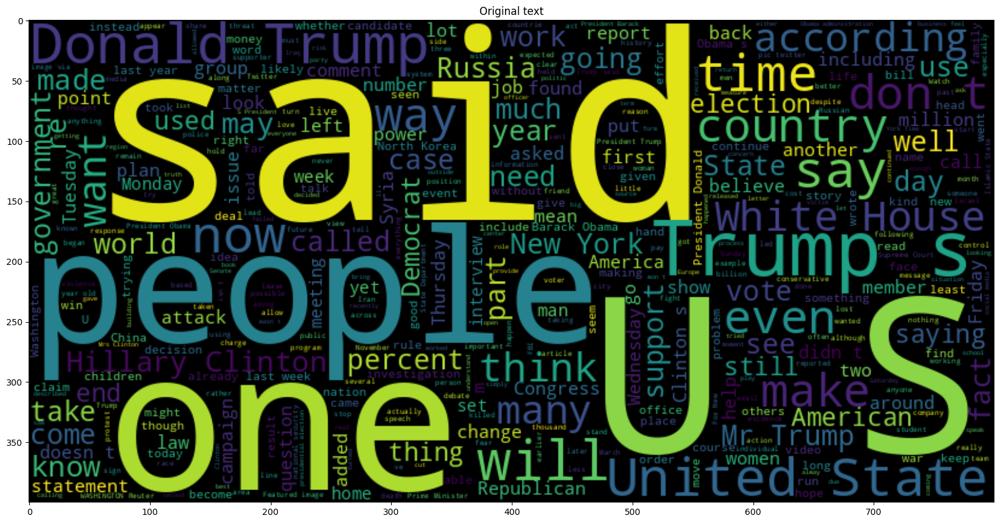

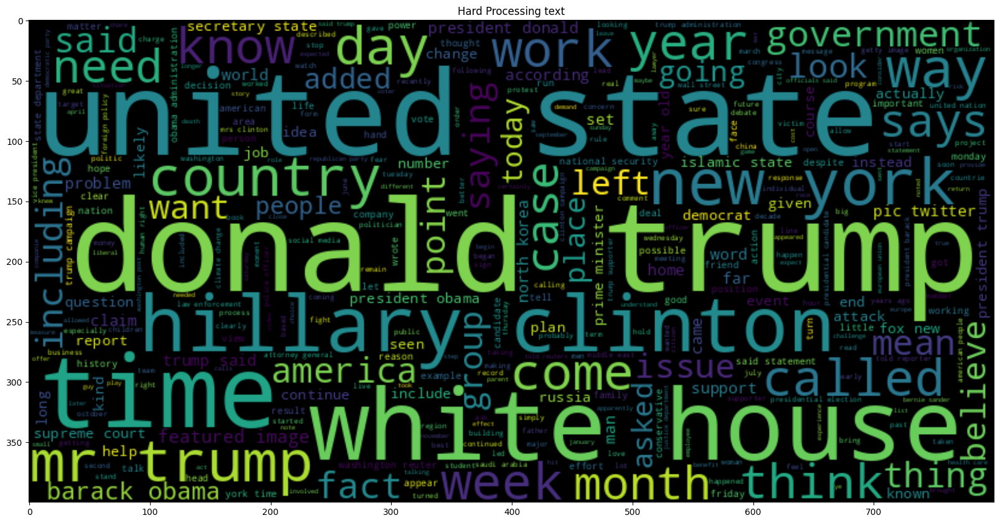

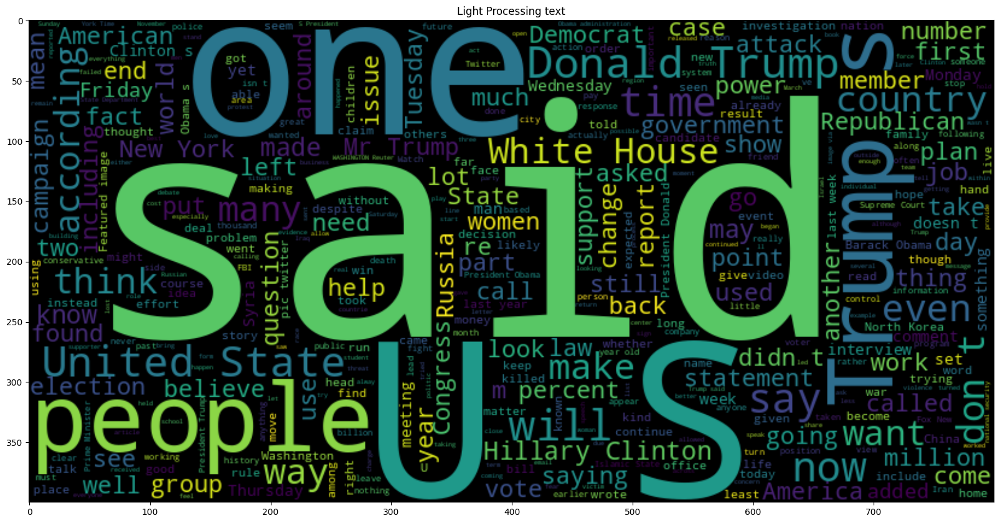

In [12]:
plt.figure(figsize = (20,20)) 
plt.title(f"Original {base_column_name}")
wc = WordCloud(max_words = 500 , width = 800 , height = 400).generate(" ".join(dataset[base_column_name]))
plt.imshow(wc, interpolation = 'bilinear')

plt.figure(figsize = (20,20)) 
plt.title(f"Hard Processing {base_column_name}")
wc = WordCloud(max_words = 500 , width = 800 , height = 400).generate(" ".join(dataset[f'hard_clean_{base_column_name}']))
plt.imshow(wc, interpolation = 'bilinear')

plt.figure(figsize = (20,20)) 
plt.title(f"Light Processing {base_column_name}")
wc = WordCloud(max_words = 500 , width = 800 , height = 400).generate(" ".join(dataset[f'light_clean_{base_column_name}']))
plt.imshow(wc, interpolation = 'bilinear')
plt.show()

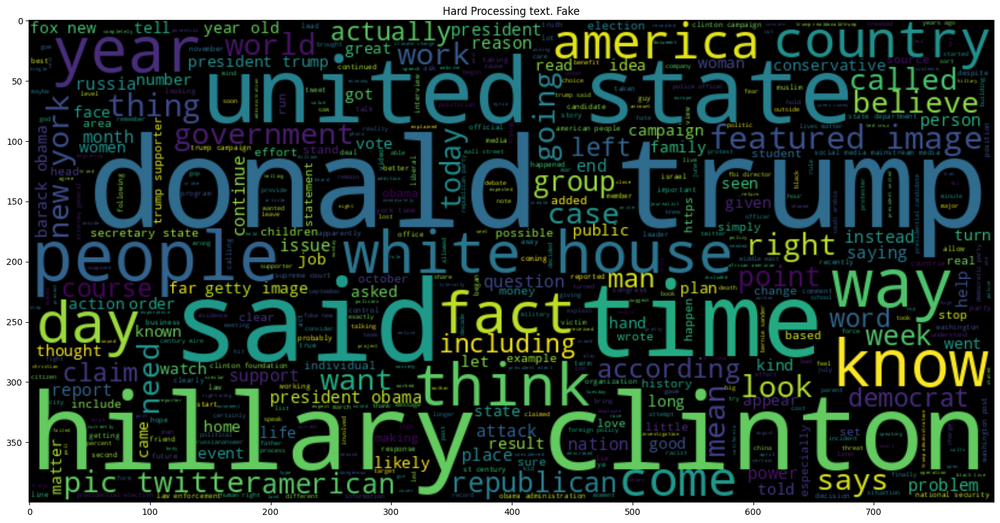

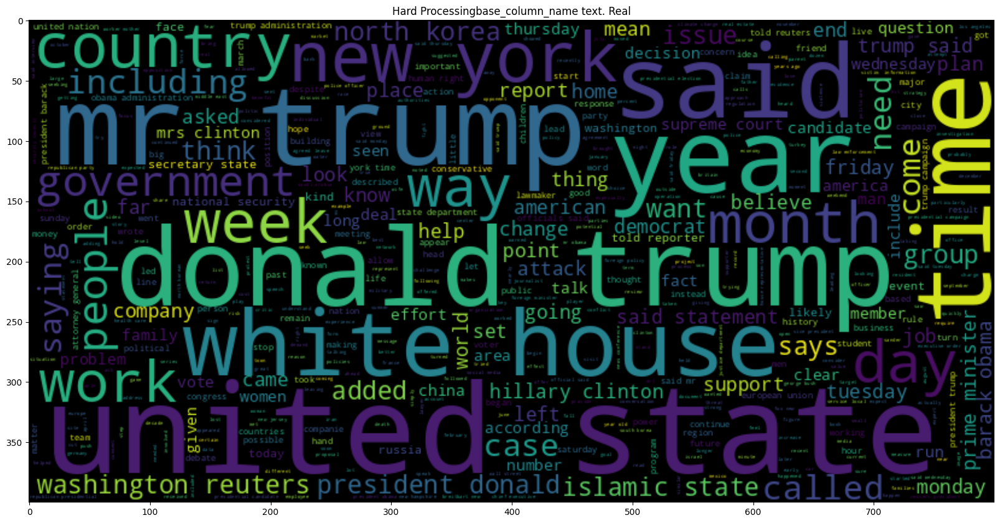

In [13]:
plt.figure(figsize = (20,20)) 
plt.title(f"Hard Processing {base_column_name}. Fake")
wc = WordCloud(max_words = 500 , width = 800 , height = 400).generate(" ".join(dataset.loc[dataset["is_fake"] == 1, f'hard_clean_{base_column_name}']))
plt.imshow(wc, interpolation = 'bilinear')

plt.figure(figsize = (20,20)) 
plt.title(f"Hard Processingbase_column_name {base_column_name}. Real")
wc = WordCloud(max_words = 500 , width = 800 , height = 400).generate(" ".join(dataset.loc[dataset["is_fake"] == 0, f'hard_clean_{base_column_name}']))
plt.imshow(wc, interpolation = 'bilinear')
plt.show()

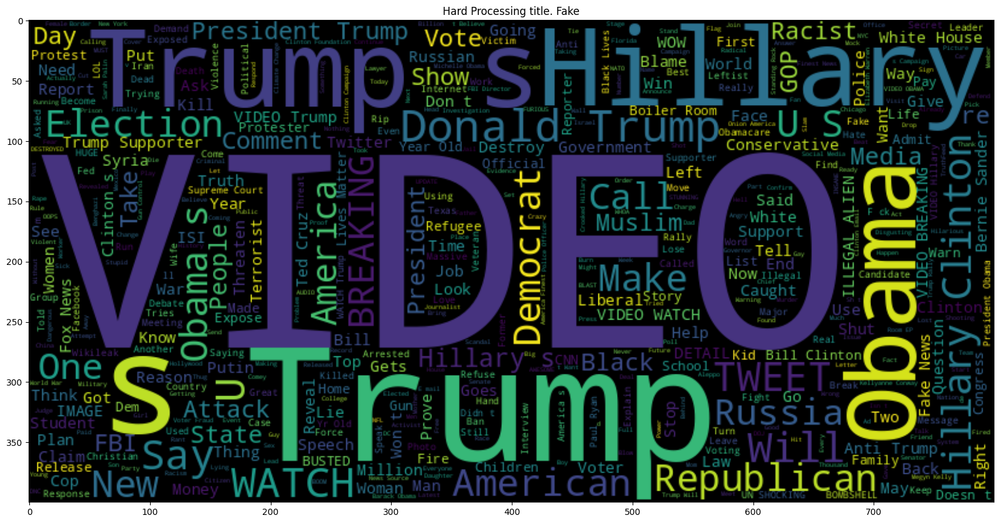

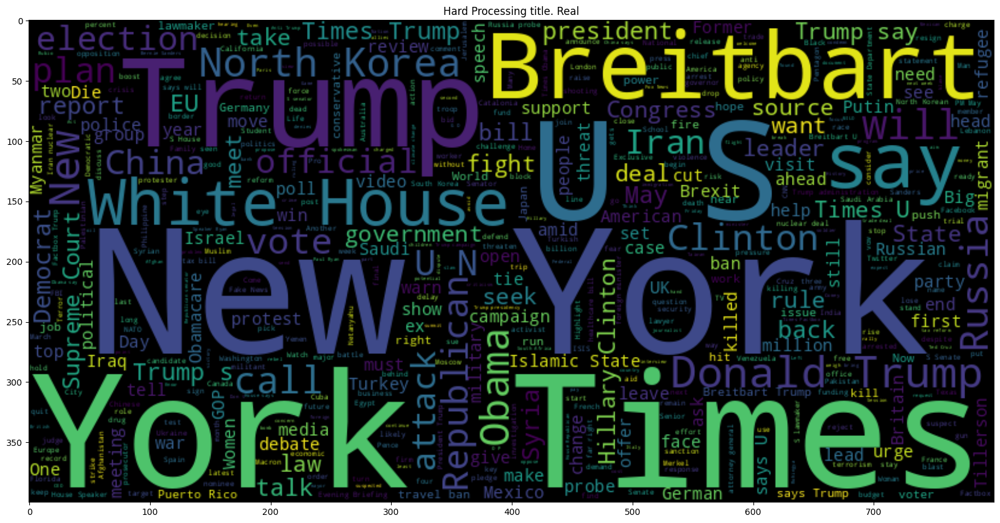

In [14]:
base_column_name = "title"

plt.figure(figsize = (20,20)) 
plt.title(f"Hard Processing {base_column_name}. Fake")
wc = WordCloud(max_words = 500 , width = 800 , height = 400).generate(" ".join(dataset.loc[dataset["is_fake"] == 1, f'light_clean_{base_column_name}']))
plt.imshow(wc, interpolation = 'bilinear')

plt.figure(figsize = (20,20)) 
plt.title(f"Hard Processing {base_column_name}. Real")
wc = WordCloud(max_words = 500 , width = 800 , height = 400).generate(" ".join(dataset.loc[dataset["is_fake"] == 0, f'light_clean_{base_column_name}']))
plt.imshow(wc, interpolation = 'bilinear')
plt.show()

> **TODO**: Can we make any conclusions regarding "trigger" words ?

In [15]:
for col in ["text", "title"]:
    dataset[f"{col}_n_symbols"] = dataset[f"light_clean_{col}"].apply(len)
    dataset[f"{col}_n_words"] = dataset[f"light_clean_{col}"].apply(lambda x: len(nltk.tokenize.word_tokenize(x)))
    dataset[f"{col}_n_sents"] = dataset[f"light_clean_{col}"].apply(lambda x: len(nltk.tokenize.sent_tokenize(x)))

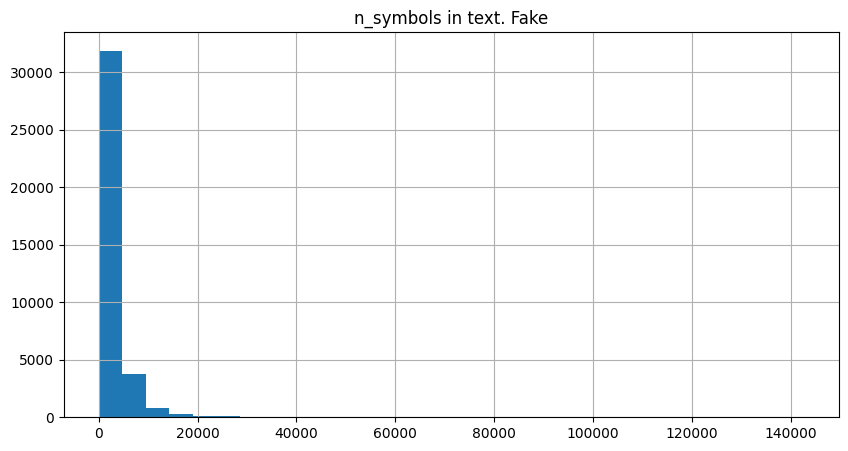

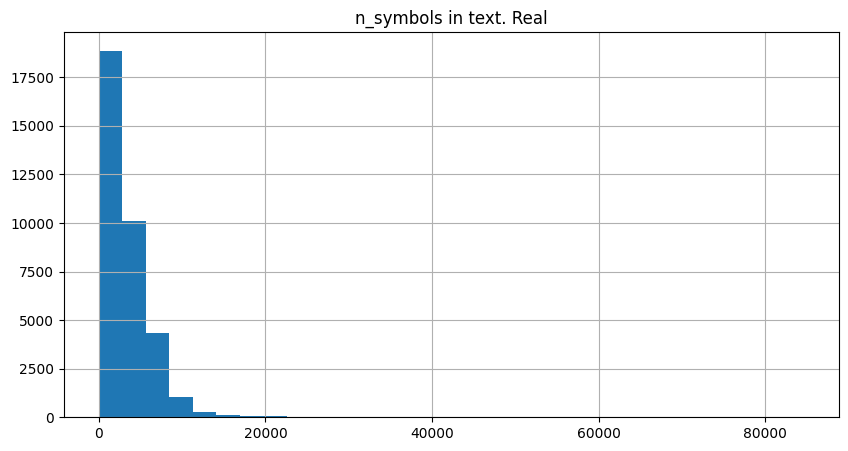

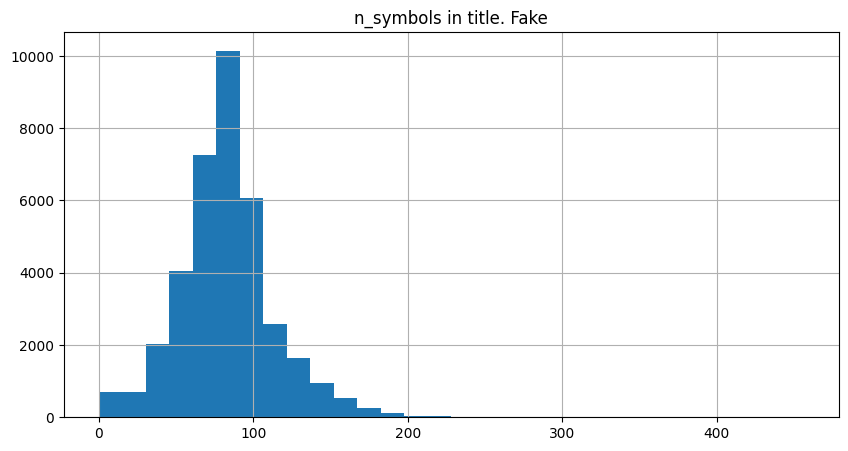

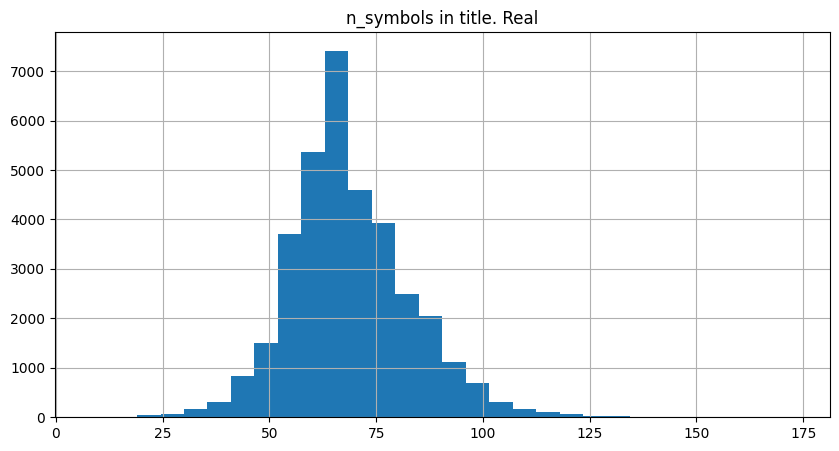

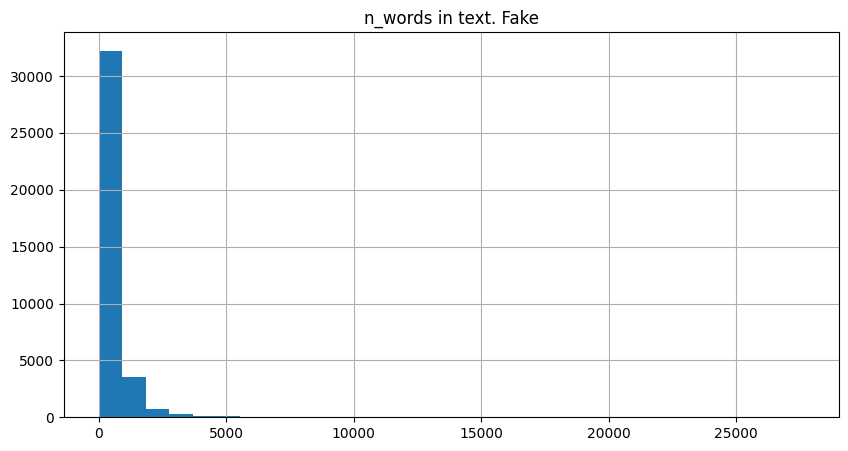

...

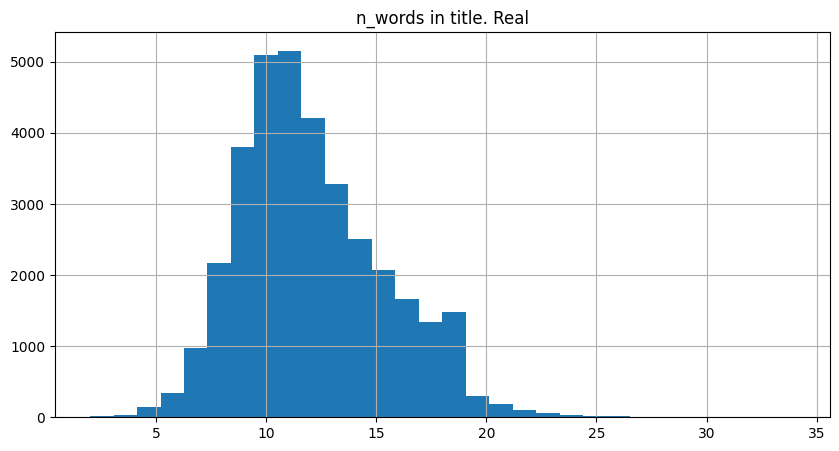

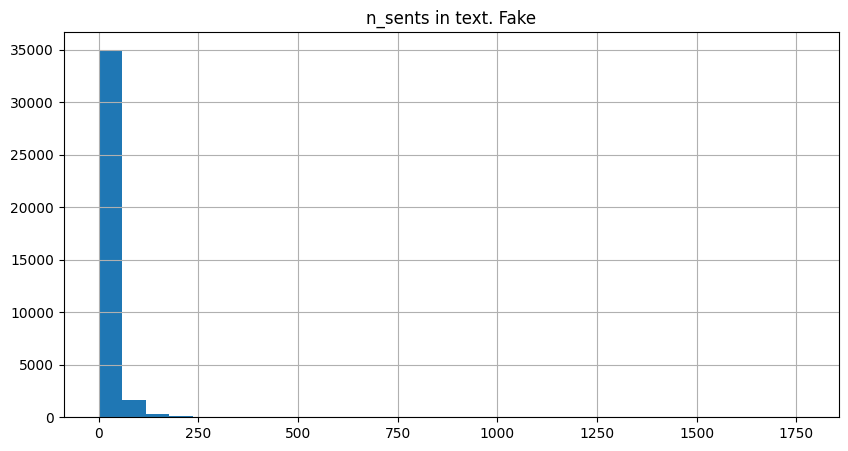

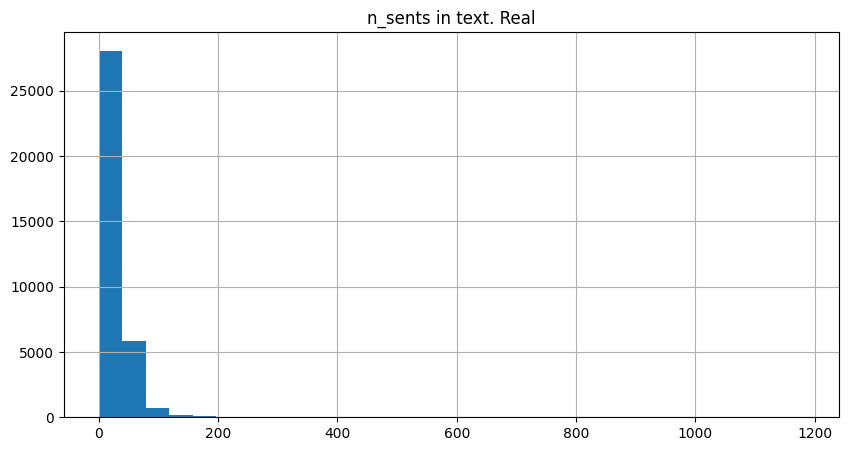

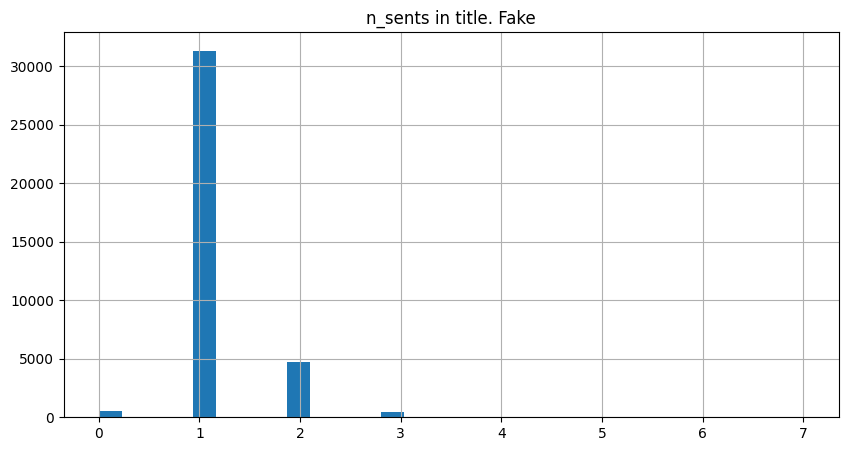

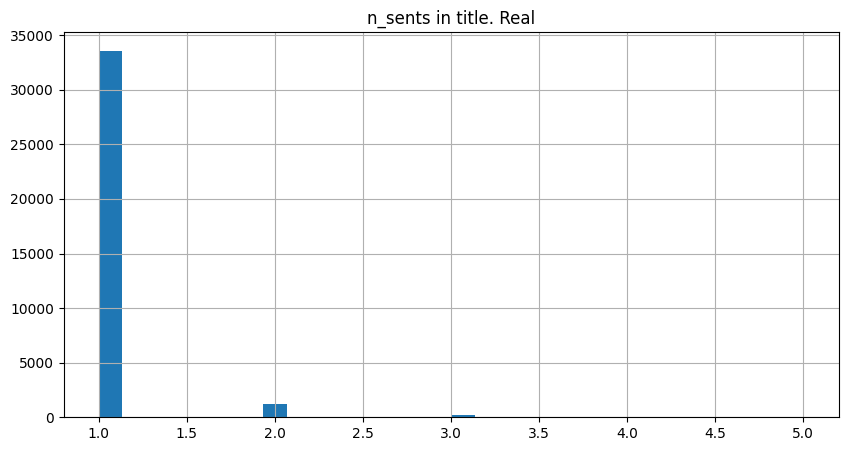

In [16]:
for stat_name in ["n_symbols", "n_words", "n_sents"]:
    for col in ["text", "title"]:
        plt.figure(figsize=(10,5))
        plt.title(f"{stat_name} in {col}. Fake")
        dataset.loc[dataset["is_fake"] == 1, f"{col}_{stat_name}"].hist(bins=30)
        plt.show()
        
        plt.figure(figsize=(10,5))
        plt.title(f"{stat_name} in {col}. Real")
        dataset.loc[dataset["is_fake"] == 0, f"{col}_{stat_name}"].hist(bins=30)
        plt.show()

> **TODO**: Explore some statistical tests in order to compare distributions

> **TODO**: Traget 0 and Target 1 text stats looks pretty different. Maybe model built only on stats may work NOT BAD

## Metric

An evaluation metric, in the context of machine learning and data analysis, is a quantitative measure used to assess the performance or quality of a model or a system's output with respect to a specific task or objective. Evaluation metrics are crucial because they provide a standardized way to measure and compare the performance of different models or systems. The choice of evaluation metric depends on the nature of the task being addressed (e.g. classification, regression, ranking) and the specific goals and requirements of the project.

More details in [3d Lecture of NLP course](https://github.com/VSydorskyy/iasa_nlp_course/blob/main/Lecture_3/Validation.ipynb)

### F1 Score

In order to introduce F1 score we need to get familiar with the **confusion matrix** that consists of 4 components:
- **TP (True Positive)** - number of pairs for which $y_{i}=1$ and $hard\_label(\hat{y_{i}})=1$ i.e. number of positives that were predicted as positives by the model
- **TN (True Negative)** - number of pairs for which $y_{i}=0$ and $hard\_label(\hat{y_{i}})=0$ i.e. number of negatives that were predicted as negatives by the model
- **FP (False Positive)** - number of pairs for which $y_{i}=0$ and $hard\_label(\hat{y_{i}})=1$ i.e. number of negatives that were predicted as positives by the model
- **FN (False Negative)** - number of pairs for which $y_{i}=1$ and $hard\_label(\hat{y_{i}})=0$ i.e. number of positives that were predicted as negatives by the model

![](https://assets-global.website-files.com/5d7b77b063a9066d83e1209c/63b413d2cdc133446aa23fc5_636b9182cfaef2115e028921_HERO_1_Confusion.png)

In [17]:
def plot_fancy_confusion_matrix_binary(y_true, y_pred, class_names=['Real', 'Fake'], figsize=(7, 5), fontsize=14, cmap='Blues'):
    """
    Plots a fancy confusion matrix for a binary classification task using seaborn heatmap.

    Parameters:
    - y_true: list or array of true labels.
    - y_pred: list or array of predicted labels.
    - class_names: list of class names for binary classification. Default is ['Real', 'Fake'].
    - figsize: tuple, size of the figure.
    - fontsize: int, fontsize for the annotations.
    - cmap: string, colormap for the heatmap.
    """
    # Compute the confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    
    # Normalize the confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    
    # Set up the matplotlib figure
    plt.figure(figsize=figsize)
    
    # Create the heatmap
    sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap=cmap, xticklabels=class_names, yticklabels=class_names)
    
    # Label the axes
    plt.xlabel('Predicted labels', fontsize=fontsize)
    plt.ylabel('True labels', fontsize=fontsize)
    
    # Set tick labels font size
    plt.xticks(fontsize=fontsize, rotation=45)
    plt.yticks(fontsize=fontsize, rotation=0)
    
    # Title for the heatmap
    plt.title('Confusion Matrix', fontsize=fontsize + 2)
    
    # Show the plot
    plt.show()

In [18]:
dataset["is_fake"].value_counts()

is_fake
1    37106
0    35028
Name: count, dtype: int64

In [19]:
# Let's create some "naive" baselines

one_class_baseline = np.ones_like(dataset["is_fake"])
zero_class_baseline = np.zeros_like(dataset["is_fake"])
binomial_baseline = np.random.binomial(n=1,p=dataset["is_fake"].mean(),size=dataset["is_fake"].shape[0])

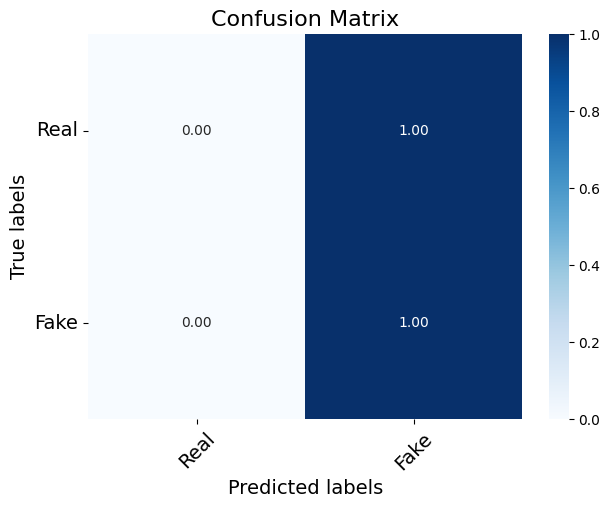

In [20]:
plot_fancy_confusion_matrix_binary(dataset["is_fake"], one_class_baseline)

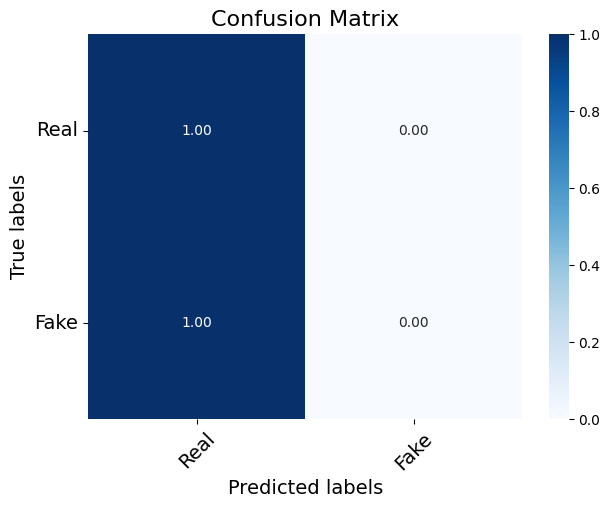

In [21]:
plot_fancy_confusion_matrix_binary(dataset["is_fake"], zero_class_baseline)

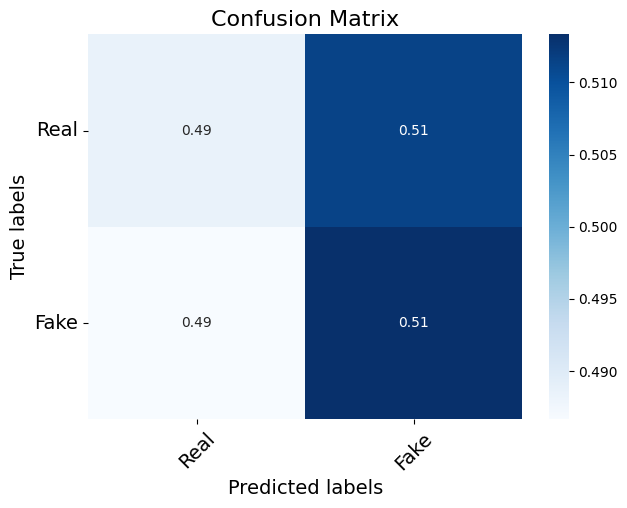

In [22]:
plot_fancy_confusion_matrix_binary(dataset["is_fake"], binomial_baseline)

**Precision & Recall**

Precision and recall are actually two metrics. But they are often used together.

**Precision** answers the question: *What percent of positive predictions were correct?*

$$precision = {\frac{TP}{TP + FP}}$$

**Recall** answers the question: *What percent of the positive cases did you catch?*

$$recall = {\frac{TP}{TP + FN}}$$

##### Pros:
    + Highly interpretable by non-technical people
    + Limited in range [0, 1]
    + Multiclass extension: can be extended to multiclass classification problems, where there are more than two classes

##### Cons:
    - Doesn't take into account TN
    - Do not make sense without each other
    - Strongly depend on the threshold

**F1-score**
The F1-score (sometimes known as the balanced F-beta score with beta=1) is a single metric that combines both precision and recall via their harmonic mean:

$$F_1 = 2*{\frac{precision * recall}{precision + recall}}$$

Unlike the arithmetic mean, the harmonic mean tends toward the smaller of the two elements. Hence the F1 score will be small if either precision or recall is small.
We actually need F1 score because in many cases we can make precision almost as close to 1 as possible but this will result a poor recall and vice-versa.

##### Pros:
    + Limited in range [0, 1]
    + Suitable for imbalanced classes case
    + Multiclass extension: can be extended to multiclass classification problems, where there are more than two classes

##### Cons:
    - Poorly interpretable (especially for people without IT/ML background)
    - Doesn't take into account TN
    - Strongly depend on the threshold

In [23]:
for baseline_name, y_pred in zip(
    ["Zero", "One", "Random"], 
    [zero_class_baseline, one_class_baseline, binomial_baseline]
):
    print(f"Precision score for {baseline_name} prediction", precision_score(dataset["is_fake"], y_pred))
    print(f"Recall score for {baseline_name} prediction", recall_score(dataset["is_fake"], y_pred))
    print(f"F1 score for {baseline_name} prediction", f1_score(dataset["is_fake"], y_pred))
    print("\n\n\n")
    

Precision score for Zero prediction 0.0
Recall score for Zero prediction 0.0
F1 score for Zero prediction 0.0




Precision score for One prediction 0.5144037485790335
Recall score for One prediction 1.0
F1 score for One prediction 0.6793482240937385




Precision score for Random prediction 0.5153679653679654
Recall score for Random prediction 0.5133401606209238
F1 score for Random prediction 0.5143520643750169






/backup/vova/src/exps/iasa_nlp_course/.venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


**ROC-AUC**

The ROC curve is created by plotting the true positive rate (TPR) against the false positive rate (FPR) at various threshold settings.

- **TPR/Recall** - *What percent of the positive cases did you catch?* 
$$TPR = {\frac{TP}{TP + FN}}$$
- **FPR/Fall-out** - *What percent of negatives would be classified as positives?* 
$$FPR = {\frac{FP}{FP + TN}}$$

$$ROCAUC = \int_{t=0}^{1} TPR(t) \,dFPR(t)$$

![](https://machinelearningmastery.com/wp-content/uploads/2018/08/ROC-Curve-Plot-for-a-No-Skill-Classifier-and-a-Logistic-Regression-Model.png)

##### Pros:
    + Limited in range [0, 1]
    + Doesn't depend on the threshold
    + Takes all TP/FP/FN/TN into account
    + Has some reference values, e.g. 0.5 - random prediction, 0.8-0.9 in balanced case - good, ~1 ideal prediction, 
    
##### Cons:
    - Poorly interpretable (especially for people without IT/ML background)
    - Doesn't distinguish between different types of errors (false positives and false negatives). In some imbalanced scenarios, you may want to prioritize one type of error over the other.

In [24]:
def plot_roc_curve(test_y, model_probs):
    fpr, tpr, _ = roc_curve(test_y, model_probs)
    plt.title(f'ROC-AUC = {roc_auc_score(test_y, model_probs):.4f}')
    plt.plot(fpr, tpr, marker='.')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.show()

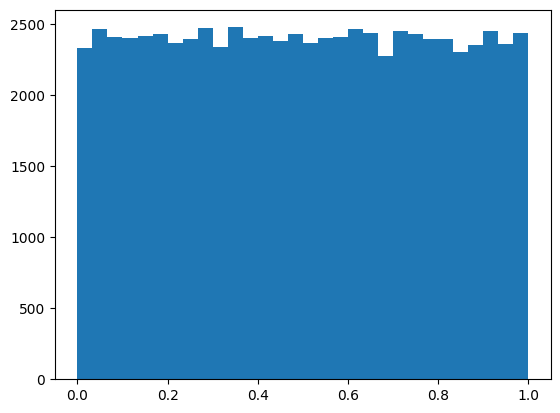

In [25]:
uniform_baseline = np.random.uniform(size=dataset["is_fake"].shape[0])
plt.hist(uniform_baseline, bins=30)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


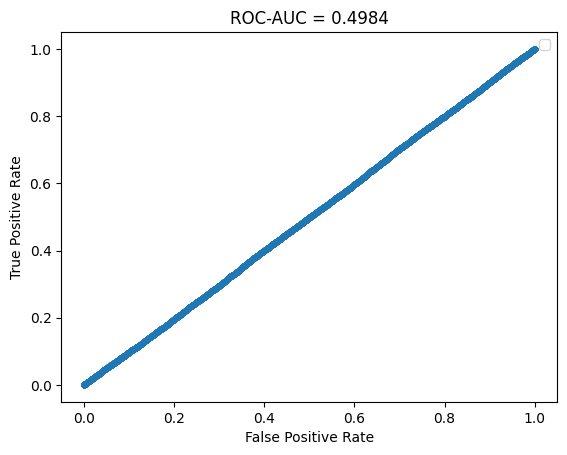

In [26]:
plot_roc_curve(dataset["is_fake"], uniform_baseline)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


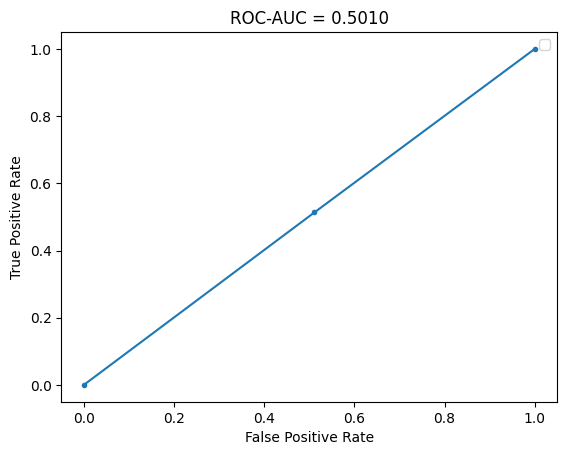

In [27]:
# NEVER DO IT, PLEASE !!!!!!!!!

plot_roc_curve(dataset["is_fake"], binomial_baseline)

<a id='Validation_Scheme'></a>
# Validation Scheme

Why do we need it?

We really don’t want to train and evaluate our model on the same dataset, since it would produce overfitting. In other words, we can’t tell whether the model simply memorized the training data or not, or whether it generalizes well to new, unseen data.

More details in [3d Lecture of NLP course](https://github.com/VSydorskyy/iasa_nlp_course/blob/main/Lecture_3/Validation.ipynb)

## Holdout / Stratified split / train-validation-test <br>

The holdout method is the simplest model evaluation technique. We take our labeled dataset and split it randomly into two parts: A **training set** and a **test set**:
![](https://sebastianraschka.com/images/blog/2016/model-evaluation-selection-part1/testing_01.png)
Then, we fit a model to the training data and predict the labels of the test set:
![](https://sebastianraschka.com/images/blog/2016/model-evaluation-selection-part1/testing_02.png)
And the fraction of correct predictions constitutes our estimate of the prediction accuracy.
![](https://sebastianraschka.com/images/blog/2016/model-evaluation-selection-part1/testing_03.png)

##### Pros:
    + Simple
    + Fast

##### Cons:
    - Not so precise estimate of out-of-sample performance comparing to more advanced techniques
    
### Class Balance

As it was said, you want your validation to mimic your test set as close as possible. And you can make a fair assumprion (that is not always true), that distribution of target on train and not seen data is the same. Then you have to use stratification. Stratification ensures stable distributions across split. That is more than just useful if:

    + Dataset is small
    + Dataset is unbalanced (average target close to 0 or to 1)
    + You have multiclassification task
    
    
### Model Checkpoint Selection

If we consider gradient-based training of models, for example neural networks or gradient boosting, then as a result of each epoch there will be some new model weights. Thus, the model at different epochs will behave differently on previously unseen data, so it is logical for the best result to choose a checkpoint from the epoch at which the target metric has the best values on previously unseen data.

However, by selecting the weights of the model in this way, we can also get some kind of overfit, since we choose these weights as the best according to the validation dataset, it is quite obvious that on average on any other previously unseen dataset the results of our model in terms of metrics will be worse.

Thus, in order to correctly select a model checkpoint after optimization or implement early stopping and also correctly estimate the results of the model on previously unseen data, we can apply train/validation/test strategy.

![](https://editor.analyticsvidhya.com/uploads/18265Screenshot-from-2020-10-06-16-35-50-768x432.png)

## K-fold / Stratified K-fold / Repeated K-fold

**K-fold Cross-validation** is probably the most common technique for model evaluation and model selection. 
- We split the dataset into *K* parts and iterate over a dataset set *K* times
- In each round one part is used for validation, and the remaining *K-1* parts are merged into a training subset for model evaluation
- We compute the cross-validation performance as the arithmetic mean over the *K* performance estimates from the validation sets.
![](https://sebastianraschka.com/images/blog/2016/model-evaluation-selection-part3/kfold.png)


**Stratified K-fold Cross-validation** - we use k-fold as described above, but we will use stratification by target on each split. <br>

**Repeated K-fold Cross-validation** - we use k-fold as described above, but we will run the whole process n times with different randomizations durig split. This strategy could be useful if we have a small dataset available and the metric varies significantly from fold to fold.<br>

##### Pros:
    + Better estimate of out-of-sample performance than simple train/test split

##### Cons:
    - Runs "K" times slower than simple train/test split

If we have **little data** and **enough time**, it's better to always do cross-validation for a more precise estimate of performance.

## Group K-fold <br>

- The dataset is divided into k folds, just like traditional k-fold cross-validation.
- Instead of random assignment to folds, GroupKFold ensures that all data points with the same group label (or identifier) are placed in the same fold.
- During each iteration of cross-validation, one of the k folds is used as the test set, while the remaining k-1 folds are used as the training set. Importantly, data points with the same group label are kept together in either the training set or the test set.
- The cross-validation process is repeated k times, with each of the k folds serving as the test set exactly once.

Group K-fold plays a very important role in NLP, there are several task examples:
- Authorship Attribution: you may have a dataset of texts written by various authors. You want to evaluate a machine learning model's ability to predict the correct author of a text or to have ability to predict different text attributes or properties for previously unseen authors. To avoid data leakage, you can use GroupKFold with author IDs as the grouping variable. This ensures that all texts from the same author are in the same fold during cross-validation.
- Sentiment Analysis: In sentiment analysis tasks, where you classify text based on sentiment (e.g., positive, negative, neutral), you might have reviews or comments grouped by products, movies, or topics. GroupKFold helps ensure that all reviews for a specific product or movie are together in one fold during cross-validation.
- Topic Modeling: In topic modeling tasks, where you aim to discover latent topics within a collection of documents, you can use GroupKFold to group documents by source or domain, ensuring that all documents from the same source are in the same fold during cross-validation.

## Kaggle Data Split <br>

In Kaggle competitions, you have 3 data subsets:
- Train - both X and Y are exposed to you
- Public Test - Only X is exposed to you. But you can Submit a solution and see the metric value
- Private Test - Only X is exposed to you. And you can **NOT** metric values till the competition ends. It will be used for the final winner choice

See [official documentation](https://www.kaggle.com/docs/competitions#leaderboard) 

It is highly important to build a reliable validation scheme using a subset of `Train`. In the best case it should correlate with `Public Test` scores but sometimes it is very hard to achieve or even completely impossible 

**If you're a competition participant - try to reproduce the actual validation split and metric that was made by competition hosts at all costs. And it doesn’t matter whether the split/metric is relevant to the business task itself or even common sense - your goal here is to win the competition.** <br>


**If you're solving a production task / you're a competition host - try to create validation split that is relevant to real life scenarios and evaluation metric that is relevant to business metrics at all costs. Your goal here is to build the solid and reliable solution with the expected performance in real life.**

Let's take a real competition example - [SenNet + HOA - Hacking the Human Vasculature in 3D](https://www.kaggle.com/competitions/blood-vessel-segmentation/overview)


My best submission by `Public` score - 6th Place on Final (`Private`) LB - 0$

![](images/senet_public_best.png)

My best submission by `Private` score - 2nd Place on Final (`Private`) LB - 20,000$

![](images/senet_private_best.png)

In our case we will follow next data split strategy:
1. Split All Data on Train / Kaggle Tests
2. Kaggle Tests split on Public / Private
3. Train split on Holdout and Training Folds
4. Split Training Folds on 5 Folds

![](images/general_val_scheme.png)

In [28]:
split_subdf = dataset["is_fake"].reset_index()

train_idx, kaggle_tests_idx, _, _ = train_test_split(
    split_subdf["index"], 
    split_subdf["index"], 
    test_size=0.3, 
    random_state=42,
    stratify=split_subdf["is_fake"]
)

private_idx, public_idx, _, _ = train_test_split(
    split_subdf.loc[kaggle_tests_idx, "index"], 
    split_subdf.loc[kaggle_tests_idx, "index"], 
    test_size=0.3, 
    random_state=42,
    stratify=split_subdf.loc[kaggle_tests_idx, "is_fake"]
)

training_folds_idx, houldout_idx, _, _ = train_test_split(
    split_subdf.loc[train_idx, "index"], 
    split_subdf.loc[train_idx, "index"], 
    test_size=0.3, 
    random_state=42,
    stratify=split_subdf.loc[train_idx, "is_fake"]
)

In [29]:
dataset["subset"] = None
dataset.loc[private_idx, "subset"] = "private"
dataset.loc[public_idx, "subset"] = "public"
dataset.loc[houldout_idx, "subset"] = "holdout"
dataset.loc[training_folds_idx, "subset"] = "training_folds"

In [30]:
split_subdf = dataset.loc[dataset["subset"] == "training_folds", ["is_fake"]]
split_subdf["subset"] = None

fold_idxs = list(StratifiedKFold(n_splits=5, shuffle=True, random_state=42).split(
    split_subdf, 
    split_subdf["is_fake"]
))

for fold_id, (_, fold_idx) in enumerate(fold_idxs):
    split_subdf["subset"].iloc[fold_idx] = f"fold_{fold_id}"

dataset.loc[dataset["subset"] == "training_folds", "subset"] = split_subdf["subset"].to_list()

/tmp/ipykernel_2655160/2320027124.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  split_subdf["subset"].iloc[fold_idx] = f"fold_{fold_id}"
/tmp/ipykernel_2655160/2320027124.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  split_subdf["subset"].iloc[fold_idx] = f"fold_{fold_id}"
/tmp/ipykernel_2655160/2320027124.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  split_subdf["subset"].iloc[fold_idx] = f"fold_{fold_id}"
/tmp/ip

In [31]:
cv_split = pd.read_csv("cv_split.csv")
dataset["subset"] = cv_split["subset"]

In [32]:
dataset["subset"].value_counts()

subset
private    15148
holdout    15148
fold_4      7069
fold_3      7069
fold_0      7069
fold_1      7069
fold_2      7069
public      6493
Name: count, dtype: int64

In [33]:
for subset_name in dataset["subset"].unique():
    print(f"Subset {subset_name} Target Distribution")
    print(dataset.loc[dataset["subset"] == subset_name, "is_fake"].value_counts(normalize=True))
    print("\n")

Subset fold_4 Target Distribution
is_fake
1    0.514358
0    0.485642
Name: proportion, dtype: float64


Subset private Target Distribution
is_fake
1    0.514391
0    0.485609
Name: proportion, dtype: float64


Subset fold_3 Target Distribution
is_fake
1    0.514358
0    0.485642
Name: proportion, dtype: float64


Subset fold_0 Target Distribution
is_fake
1    0.5145
0    0.4855
Name: proportion, dtype: float64


Subset fold_1 Target Distribution
is_fake
1    0.5145
0    0.4855
Name: proportion, dtype: float64


Subset holdout Target Distribution
is_fake
1    0.514391
0    0.485609
Name: proportion, dtype: float64


Subset fold_2 Target Distribution
is_fake
1    0.514358
0    0.485642
Name: proportion, dtype: float64


Subset public Target Distribution
is_fake
1    0.5144
0    0.4856
Name: proportion, dtype: float64




In [34]:
public_dataset = dataset[dataset["subset"] == "public"].reset_index(drop=True)
private_dataset = dataset[dataset["subset"] == "private"].reset_index(drop=True)
holdout_dataset = dataset[dataset["subset"] == "holdout"].reset_index(drop=True)
training_folds = dataset[dataset["subset"].apply(lambda x: x.startswith("fold"))].reset_index(drop=True)

In [35]:
public_dataset.shape[0] + private_dataset.shape[0] + holdout_dataset.shape[0] + training_folds.shape[0], dataset.shape[0]

(72134, 72134)

> **TODO**: Can you explain possible problems with proposed split strategy ?

<a id='ML_Baseline'></a>
# ML Baseline

In this section, we will overview basic text vectorization algorithms and ML models

Detailed overview can be seen in [2nd Lecture](https://github.com/VSydorskyy/iasa_nlp_course/blob/v2023_autumn_iasa/Lecture_2/lecture2_text_repr_classic_ml.ipynb)

## How "Translate" Text into Numbers 

![tf-idf](https://habrastorage.org/files/a0a/bb1/2e9/a0abb12e9ed94624ade0b9090d26ad66.png)

## [Tf-Idf](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html#sklearn.feature_extraction.text.TfidfVectorizer)

TF-IDF is a numerical statistic that quantifies the relevance of a word in a document relative to a corpus of documents. It is widely used in information retrieval and text mining for various NLP tasks, such as document ranking, content recommendation, and text classification.

**Term Frequency (TF)**: This component measures how frequently a term appears in a document. It is calculated as the number of times a term occurs in a document divided by the total number of terms in that document. TF emphasizes the importance of a term within a single document.

`TF = (Number of times term t appears in a document) / (Total number of terms in the document)`

**Inverse Document Frequency (IDF)**: IDF measures the importance of a term across a collection of documents. It is calculated as the logarithm of the total number of documents divided by the number of documents containing the term. IDF helps in identifying terms that are rare or unique across the corpus.

`IDF = log(Total number of documents / Number of documents containing term t)`

![tfidf](images/tfidf.png)

In [36]:
idx = 9
n_samples = 20

tf_idf_object = TfidfVectorizer()
tf_idf_matrix = tf_idf_object.fit_transform(
    training_folds["light_clean_title"].iloc[:n_samples]
)
print(f"Vocab: {tf_idf_object.get_feature_names_out()}")
print(
    f"Text : {training_folds['light_clean_title'].iloc[idx]}\n"
    f"Vectorization: {tf_idf_object.transform([training_folds['light_clean_title'].iloc[idx]]).toarray()[0]}"
)

Vocab: ['11by' '2016' 'about' 'access' 'accomplishments' 'against' 'agenda'
 'alert' 'alliance' 'amazon' 'america' 'american' 'an' 'and'
 'announcement' 'anything' 'appeal' 'appears' 'arrest' 'article' 'as' 'at'
 'audit' 'bankers' 'bans' 'bar' 'ben' 'benefits' 'bid' 'biden'
 'billionaire' 'bobby' 'boom' 'boss' 'brazil' 'breakfast' 'breitbart' 'by'
 'carson' 'case' 'chair' 'change' 'china' 'christian' 'cited' 'clinton'
 'coming' 'considers' 'conversion' 'cops' 'coup' 'court' 'credit' 'crime'
 'dakota' 'dangers' 'danish' 'days' 'decline' 'designation' 'despite' 'dr'
 'emboldened' 'end' 'enforcement' 'espn' 'evangelicals' 'everyone'
 'evidence' 'expected' 'explain' 'extends' 'extremism' 'faces' 'fake'
 'family' 'first' 'following' 'for' 'from' 'games' 'government' 'group'
 'had' 'has' 'hate' 'hear' 'hell' 'high' 'hillary' 'hindu' 'his' 'house'
 'how' 'huge' 'id' 'in' 'intel' 'ipsos' 'irs' 'islamist' 'it' 'jindal'
 'joe' 'korea' 'latest' 'laughing' 'law' 'lead' 'leak' 'liberal' 'like'
 'ma

In [37]:
idx = 9
n_samples = 20

tf_idf_object = TfidfVectorizer()
tf_idf_matrix = tf_idf_object.fit_transform(
    training_folds["hard_clean_title"].iloc[:n_samples]
)
print(f"Vocab: {tf_idf_object.get_feature_names_out()}")
print(
    f"Text : {training_folds['hard_clean_title'].iloc[idx]}\n"
    f"Vectorization: {tf_idf_object.transform([training_folds['hard_clean_title'].iloc[idx]]).toarray()[0]}"
)

Vocab: ['access' 'accomplishments' 'agenda' 'alert' 'alliance' 'amazon' 'america'
 'american' 'announcement' 'appeal' 'appears' 'arrest' 'article' 'audit'
 'bankers' 'bans' 'bar' 'ben' 'benefits' 'bid' 'biden' 'billionaire'
 'bobby' 'boom' 'boss' 'brazil' 'breakfast' 'breitbart' 'carson' 'case'
 'chair' 'change' 'china' 'christian' 'cited' 'clinton' 'coming'
 'considers' 'conversion' 'cops' 'coup' 'court' 'credit' 'crime' 'dakota'
 'dangers' 'danish' 'days' 'decline' 'designation' 'despite' 'dr'
 'emboldened' 'end' 'enforcement' 'espn' 'evangelicals' 'evidence'
 'expected' 'explain' 'extends' 'extremism' 'faces' 'fake' 'family'
 'following' 'fyf' 'games' 'government' 'group' 'hate' 'hear' 'hell'
 'high' 'hillary' 'hindu' 'house' 'huge' 'id' 'intel' 'ipsos' 'irs'
 'islamist' 'jindal' 'joe' 'korea' 'latest' 'laughing' 'law' 'lead' 'leak'
 'liberal' 'like' 'major' 'man' 'migrant' 'mugabe' 'national' 'new' 'nfl'
 'north' 'nra' 'odebrecht' 'outstanding' 'owner' 'pay' 'pipeline' 'points'
 'p

## Sentence embeddings
Sentence embeddings, also known as sentence-level embeddings or sentence representations, are numerical representations of entire sentences or text passages. These embeddings capture the semantic meaning and context of a sentence. Unlike word embeddings, which represent individual words, sentence embeddings represent entire sentences as single vectors.



![](images/sentence_embs.png)


> **Explore**: How can we get sentence embeddings: https://engineering.talkdesk.com/what-are-sentence-embeddings-and-why-are-they-useful-53ed370b3f35

SpaCy, a popular natural language processing library, provides sentence embeddings using pre-trained models like `en_core_web_sm` or `en_core_web_lg` for the English language. These models are built on top of word embeddings (e.g., word2vec or GloVe) and incorporate sentence-level information through techniques such as convolutional neural networks (CNNs) and mean pooling. 

> **Explore**: Read more how sentence embeddings for SpaCy and SentenceTransformers are trained. Links:
> - https://spacy.io/
> - https://www.sbert.net/


In [38]:
sent_tr = SentenceTransformer('all-mpnet-base-v2',device="cuda")

print(
    f"Text : {training_folds['light_clean_title'].iloc[idx]}\n"
    f"Vectorization: {sent_tr.encode([training_folds['light_clean_title'].iloc[idx]])[0]}"
)

Text : MAJOR LIBERAL RAG RELUCTANTLY PUBLISHES Article On President Trump s Outstanding Accomplishments It s How They Explain His Successes That Has Everyone Laughing
Vectorization: [-2.53071841e-02  1.16853952e-01  1.79677140e-02 -1.08487147e-03
 -3.64549235e-02  5.92491589e-03 -1.25838378e-02 -1.34550757e-03
  8.94648768e-03 -5.40289767e-02  1.15189347e-02  4.08664979e-02
 -4.03271336e-03  2.73892079e-02 -3.51245105e-02  4.96618338e-02
  3.14922780e-02  4.43929806e-02 -5.26661566e-03 -5.86165898e-02
 -4.75378744e-02 -1.72820427e-02  3.55781289e-03 -6.98646298e-03
  4.24353145e-02  1.39039494e-02  6.79390207e-02  5.41449375e-02
 -1.46124111e-02 -5.94420210e-02 -6.45846874e-02  1.79343391e-02
 -2.48990357e-02  1.86322741e-02  1.52441635e-06 -3.63628077e-03
 -4.00766172e-02  3.13473605e-02 -5.71538601e-03 -1.37599828e-02
  1.05559081e-01 -2.45401300e-02 -7.19789714e-02 -4.83803600e-02
  4.75111865e-02 -4.55873385e-02  2.20432226e-03  5.71600460e-02
 -3.42942588e-02  3.35919596e-02  2.52

**Pros and Cons** 

Tf-Idf:
- Explainable
- Can be easily integrated into [sklrean Pipeline](https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html)
- Can be tuned with hyperparameters
- Requires less computational resources
- Incorporates only independent n-gram information

Sentence Embeddings:
- In most cases, produce "better" embedding (in terms of final quality)
- Are not biased to the training set
- Takes overall context into account

## [Logistic Regression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.htm)


### Model
Given $\large \mathcal{D} = \left\{ \left(x_i, y_i\right) \right\}$ - our training dataset, $\large \mathcal{H} = \left\{ h\left(x, \theta\right) | \theta \in R^n \right\}$ - logistic regression model

* where
    * $\large x_i \in  R^n$    
    * $\large y_i \in  \left\{0, 1\right\}$
    * $\large h(x_i, \theta) = \sigma \left(\theta ^ T x_i \right) = \dfrac{1}{1 + e ^ \left( - \theta ^ T x_i \right)} = \dfrac{1}{1 + e ^ \left( - \sum_{j=1}^n \theta_j x_{ij} \right)},$ $\large h(x_i, \theta) \in \left(0, 1\right)$
    * $\sigma \left(z\right) = \dfrac{1}{1 + e ^ \left(-z \right)}$ - logistic function, aka sigmoid
    
### Loss function
$y_i \sim Bernoulli(p)$, where p is an unknown parameter <br>
Let's estimate conditional probability $Pr\left\{y_i = 1 | x_i \right\} = \large h(x_i, \theta)$ with Maximum Likelihood Estimation.<br> Obviously, that $Pr\left\{y_i = 0 | x_i \right\} = 1 - \large h(x_i, \theta)$ <br>
Also we can define $Pr\left\{y = y_i | x_i \right\} = \large h(x_i, \theta)^{y_i} \left(1 - \large h(x_i, \theta)\right)^{1 - y_i}$ <br> 
We now calculate the likelihood function assuming that all the observations in the sample are independently Bernoulli distributed: <br>

$L\left(\theta | x\right) = \prod_{i=1}^m Pr\left\{y = y_i | x_i \right\} = \prod_{i=1}^m h\left(x_i, \theta\right)^{y_i} \left(1 - h\left(x_i, \theta\right)\right)^{1 - y_i}$ <br>


Typically, the log likelihood is maximized: 

$log\left(L\left(\theta | x\right) \right) = log\left(\prod_{i=1}^m Pr\left\{y = y_i | x_i \right\}\right) = log\left(\prod_{i=1}^m h\left(x_i, \theta\right)^{y_i} \left(1 - h\left(x_i, \theta\right)\right)^{1 - y_i}\right) = \sum_{i=1}^m log\left(h\left(x_i, \theta\right)^{y_i} \left(1 - h\left(x_i, \theta\right)\right)^{1 - y_i}\right) = \sum_{i=1}^m y_ilog\left(h\left(x_i, \theta\right) \right) + \left(1 - y_i\right) log\left(1 - h\left(x_i, \theta\right) \right)$ <br>

So, finally, we can define our classification loss function as $\large L\left(\hat{y}, y\right) = - ylog\left(\hat{y} \right) - \left(1 - y\right) log\left(1 - \hat{y} \right)$ where $\hat{y} = h\left(x_i, \theta\right) $

Now, when we have dataset, model and loss function, we can perform training and find the best estimation $\large \hat{h} =\arg \min_{h \in \mathcal{H}} \left(\frac{1}{n} \sum_{i=1}^n L\left(h\left(x_i\right), y_i\right)\right)$ <br>

### Optimization
We can find it using Gradient Descent method: <br>
Gradient descent is based on the observation that if the multi-variable function $\large F$ is defined and differentiable in a neighborhood of a point $\large a$, then $\large F$ decreases fastest if one goes from a in the direction of the negative gradient of $\large F$ at $\large a$. <br>

Define $\vec{w_{n + 1}} = \vec{w_{n}} - \alpha\frac{\partial \mathcal{L}}{\partial \vec{w}} \left(\vec{w_{n}}\right)$, where $\alpha$ is a small number, called learning rate. <br>

If $\vec{w_{n}}$ converges, then it converges to local minimum. If $\mathcal{L}$ is a convex function, then $\vec{w_{n}}$ converges to the global minimum.

In our case of optimization our loss function (log-loss) for logistic regression model: <br>

$$\large \begin{array}{rcl} - \frac{\partial \mathcal{L}}{\partial \vec{w}} &=& \frac{\partial}{\partial \vec{w}}\sum_{i=1}^n y_i \ln \sigma\left(\vec{w}^T \vec{x}_i\right) + \left(1 - y_i\right) \ln \left(1 - \sigma\left(\vec{w}^T \vec{x}_i\right)\right) \\
&=& \sum_{i=1}^n y_i \frac{1}{\sigma} \sigma \left(1 - \sigma\right) \vec{x}_i + \left(1 - y_i\right) \frac{1}{1 - \sigma} \left(-1\right)\sigma \left(1 - \sigma\right) \vec{x}_i \\
&=& \sum_{i=1}^n y_i \left(1 - \sigma\right) \vec{x}_i - \left(1 - y_i\right) \sigma \vec{x}_i \\
&=& \sum_{i=1}^n \vec{x}_i \left(y_i - \sigma\right)
\end{array}$$

## Logistic Regression + Tf-Idf

In [39]:
all_train_preds = []
all_val_preds = []
all_train_targets = []
all_val_targets = []
all_models = []
for fold_id in range(training_folds["subset"].nunique()):
    train_fold = training_folds[training_folds["subset"] != f"fold_{fold_id}"]
    val_fold = training_folds[training_folds["subset"] == f"fold_{fold_id}"]

    text_vectorizer = TfidfVectorizer(
        analyzer='word',
        stop_words='english',
        ngram_range=(1, 2),
        lowercase=True,
        min_df=5,
        max_features=10000
    )
    title_vectorizer = TfidfVectorizer(
        analyzer='word',
        stop_words='english',
        ngram_range=(1, 2),
        lowercase=True,
        min_df=5,
        max_features=10000
    )

    # Use a ColumnTransformer to apply the different vectorizations to each specific column
    preprocessor = ColumnTransformer(
        transformers=[
            ('text_vect', text_vectorizer, 'hard_clean_text'),
            ('title_vect', title_vectorizer, 'hard_clean_title')
        ],
        remainder='drop'  # This drops the columns not specified in transformers
    )

    # Create a pipeline that uses the ColumnTransformer and then applies logistic regression
    model = Pipeline([
        ('vectorizer', preprocessor),
        ('log_reg', LogisticRegression())
    ])

    model.fit(train_fold, train_fold['is_fake'])
    # Take probabilities for 1st class (not 0 class)
    fold_train_preds = model.predict_proba(train_fold)[:,1]
    fold_val_preds = model.predict_proba(val_fold)[:,1]
    
    fold_train_targets = train_fold['is_fake'].values
    fold_val_targets = val_fold['is_fake'].values
    
    print(f"Fold {fold_id+1}")
    print("Train F1:\t", f1_score(fold_train_targets, fold_train_preds > 0.5))
    print("Val F1:\t", f1_score(fold_val_targets, fold_val_preds > 0.5))
    
    print("Train Roc Auc:\t", roc_auc_score(fold_train_targets, fold_train_preds))
    print("Val Roc Auc:\t", roc_auc_score(fold_val_targets, fold_val_preds))
    
    all_train_preds.append(fold_train_preds)
    all_val_preds.append(fold_val_preds)
    all_train_targets.append(fold_train_targets)
    all_val_targets.append(fold_val_targets)
    all_models.append(model)
    print()

Fold 1
Train F1:	 0.9794679399727148
Val F1:	 0.9585766671193806
Train Roc Auc:	 0.9979446657613372
Val Roc Auc:	 0.9908828455020371

Fold 2
Train F1:	 0.9790515182531558
Val F1:	 0.9608056614044639
Train Roc Auc:	 0.9980061376226141
Val Roc Auc:	 0.9908609743294924

Fold 3
Train F1:	 0.9792675441587669
Val F1:	 0.9630840484947555
Train Roc Auc:	 0.9978121145475254
Val Roc Auc:	 0.9929713769512695

Fold 4
Train F1:	 0.9800579512527698
Val F1:	 0.9585266030013643
Train Roc Auc:	 0.9979284944695127
Val Roc Auc:	 0.9908171417199977

Fold 5
Train F1:	 0.9795584069890455
Val F1:	 0.9592502037489812
Train Roc Auc:	 0.9978670724283382
Val Roc Auc:	 0.9922590933721976



> **TODO**: Tune Hyperparameters

> **TODO**: What if instead of embedding matrix concatenation we just concatenate text + "|" + title ? 

In [40]:
oof_train_preds = np.concatenate(all_train_preds)
oof_val_preds = np.concatenate(all_val_preds)
oof_train_targets = np.concatenate(all_train_targets)
oof_val_targets = np.concatenate(all_val_targets)

In [41]:
f_metrics = []
tholds = [0.1, 0.25, 0.45, 0.5, 0.55, 0.75, 0.9]
for th in tholds:
    f_metrics.append({
        'positives_ratio': (oof_val_preds >= th).sum()/oof_val_preds.shape[0],
        'precision': precision_score(oof_val_targets, oof_val_preds >= th),
        'recall': recall_score(oof_val_targets, oof_val_preds >= th),
        'f1': f1_score(oof_val_targets, oof_val_preds >= th),
    })
pd.DataFrame(f_metrics, index=tholds)

,positives_ratio,precision,recall,f1
0.10,0.648578,0.792314,0.998955,0.883715
0.25,0.571679,0.893497,0.992960,0.940606
0.45,0.533145,0.943006,0.977340,0.959866
0.50,0.525166,0.950221,0.970080,0.960048
0.55,0.516877,0.956922,0.961500,0.959206
0.75,0.466431,0.979619,0.888241,0.931695
0.90,0.360079,0.993793,0.695633,0.818402


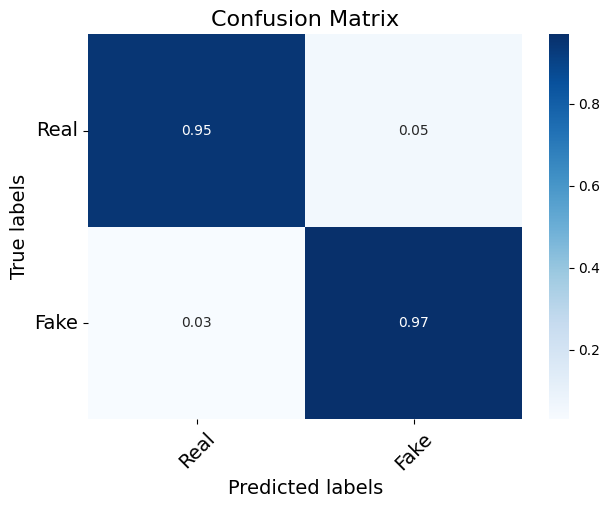

In [42]:
plot_fancy_confusion_matrix_binary(oof_val_targets, oof_val_preds > 0.5)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


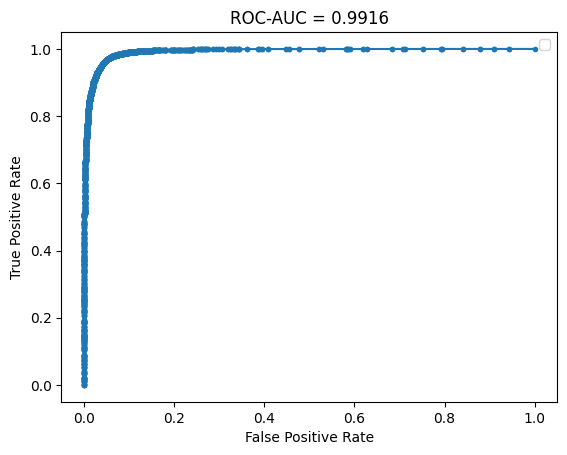

In [43]:
plot_roc_curve(oof_val_targets, oof_val_preds)

In [44]:
holdout_preds = np.stack([model.predict_proba(holdout_dataset)[:,1] for model in tqdm(all_models)])

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:39<00:00,  7.83s/it]


In [45]:
holdout_preds

array([[0.11150071, 0.12937986, 0.01122523, ..., 0.83285814, 0.98827958,
        0.22508975],
       [0.10211502, 0.16603245, 0.00975677, ..., 0.83843189, 0.9898122 ,
        0.30647751],
       [0.11242078, 0.15050194, 0.010674  , ..., 0.80477511, 0.98953658,
        0.24284472],
       [0.14635105, 0.14247274, 0.00988773, ..., 0.79588699, 0.98626444,
        0.23407785],
       [0.1313999 , 0.14709697, 0.0109875 , ..., 0.85920317, 0.98930232,
        0.20584655]])

In [46]:
holdout_preds = holdout_preds.mean(0)

In [47]:
print("Holdout F1:\t", f1_score(holdout_dataset["is_fake"], holdout_preds > 0.5))
print("Holdout Roc Auc:\t", roc_auc_score(holdout_dataset["is_fake"], holdout_preds))

Holdout F1:	 0.9621202491419855
Holdout Roc Auc:	 0.9929151341625049


## Logistic Regression + Sentence Embeddings

In [48]:
sent_tr = SentenceTransformer('all-mpnet-base-v2',device="cuda")

training_folds_text_embs = sent_tr.encode(training_folds["light_clean_text"].to_list(), show_progress_bar=True, device="cuda")
training_folds_title_embs = sent_tr.encode(training_folds["light_clean_title"].to_list(), show_progress_bar=True, device="cuda")

Batches:   0%|          | 0/1105 [00:00<?, ?it/s]

Batches:   0%|          | 0/1105 [00:00<?, ?it/s]

In [49]:
all_train_preds = []
all_val_preds = []
all_train_targets = []
all_val_targets = []
all_models_v2 = []
for fold_id in range(training_folds["subset"].nunique()):
    train_fold = training_folds[training_folds["subset"] != f"fold_{fold_id}"]
    val_fold = training_folds[training_folds["subset"] == f"fold_{fold_id}"]

    model = Pipeline([
        ('scaler', StandardScaler()),
        ('log_reg', LogisticRegression(max_iter=1000))
    ])

    model.fit(
        np.hstack((training_folds_text_embs[train_fold.index], training_folds_title_embs[train_fold.index])), 
        train_fold['is_fake']
    )
    # Take probabilities for 1st class (not 0 class)
    fold_train_preds = model.predict_proba(
        np.hstack((training_folds_text_embs[train_fold.index], training_folds_title_embs[train_fold.index]))
    )[:,1]
    fold_val_preds = model.predict_proba(
        np.hstack((training_folds_text_embs[val_fold.index], training_folds_title_embs[val_fold.index]))
    )[:,1]
    
    fold_train_targets = train_fold['is_fake'].values
    fold_val_targets = val_fold['is_fake'].values
    
    print(f"Fold {fold_id+1}")
    print("Train F1:\t", f1_score(fold_train_targets, fold_train_preds > 0.5))
    print("Val F1:\t", f1_score(fold_val_targets, fold_val_preds > 0.5))
    
    print("Train Roc Auc:\t", roc_auc_score(fold_train_targets, fold_train_preds))
    print("Val Roc Auc:\t", roc_auc_score(fold_val_targets, fold_val_preds))
    
    all_train_preds.append(fold_train_preds)
    all_val_preds.append(fold_val_preds)
    all_train_targets.append(fold_train_targets)
    all_val_targets.append(fold_val_targets)
    all_models_v2.append(model)
    print()

Fold 1
Train F1:	 0.9690912837420151
Val F1:	 0.9440463065049614
Train Roc Auc:	 0.9952959130074774
Val Roc Auc:	 0.9846060593242337

Fold 2
Train F1:	 0.9692138537658055
Val F1:	 0.9424242424242423
Train Roc Auc:	 0.9950175496731269
Val Roc Auc:	 0.986345338283749

Fold 3
Train F1:	 0.9696240808191876
Val F1:	 0.9411117226197029
Train Roc Auc:	 0.9954124139317827
Val Roc Auc:	 0.98417474284568

Fold 4
Train F1:	 0.9699573765983776
Val F1:	 0.9456596505709176
Train Roc Auc:	 0.9948441886998065
Val Roc Auc:	 0.9871335516889878

Fold 5
Train F1:	 0.968333562302514
Val F1:	 0.9461686349903873
Train Roc Auc:	 0.9949186642390933
Val Roc Auc:	 0.9868085337517148



In [50]:
oof_train_preds = np.concatenate(all_train_preds)
oof_val_preds = np.concatenate(all_val_preds)
oof_train_targets = np.concatenate(all_train_targets)
oof_val_targets = np.concatenate(all_val_targets)

In [51]:
f_metrics = []
tholds = [0.1, 0.25, 0.45, 0.5, 0.55, 0.75, 0.9]
for th in tholds:
    f_metrics.append({
        'positives_ratio': (oof_val_preds >= th).sum()/oof_val_preds.shape[0],
        'precision': precision_score(oof_val_targets, oof_val_preds >= th),
        'recall': recall_score(oof_val_targets, oof_val_preds >= th),
        'f1': f1_score(oof_val_targets, oof_val_preds >= th),
    })
pd.DataFrame(f_metrics, index=tholds)

,positives_ratio,precision,recall,f1
0.10,0.570434,0.884882,0.981245,0.930576
0.25,0.541350,0.919567,0.967715,0.943027
0.45,0.518998,0.940744,0.949126,0.944916
0.50,0.513595,0.944637,0.943131,0.943883
0.55,0.508587,0.948543,0.937796,0.943138
0.75,0.485953,0.963146,0.909856,0.935743
0.90,0.453841,0.976435,0.861456,0.915349


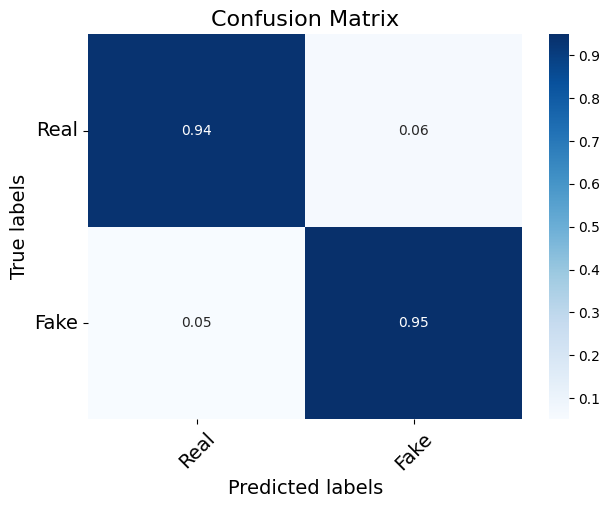

In [52]:
plot_fancy_confusion_matrix_binary(oof_val_targets, oof_val_preds > 0.45)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


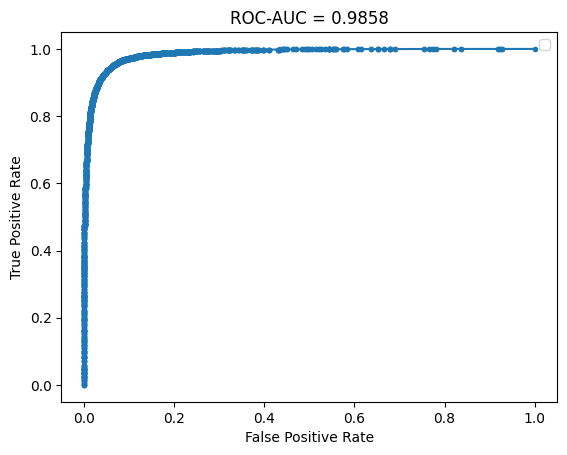

In [53]:
plot_roc_curve(oof_val_targets, oof_val_preds)

In [54]:
houldout_text_embs = sent_tr.encode(holdout_dataset["light_clean_text"].to_list(), show_progress_bar=True, device="cuda")
houldout_title_embs = sent_tr.encode(holdout_dataset["light_clean_title"].to_list(), show_progress_bar=True, device="cuda")

Batches:   0%|          | 0/474 [00:00<?, ?it/s]

Batches:   0%|          | 0/474 [00:00<?, ?it/s]

In [55]:
holdout_preds = np.stack([model.predict_proba(
    np.hstack((houldout_text_embs, houldout_title_embs))
)[:,1] for model in tqdm(all_models_v2)])

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:29<00:00,  5.99s/it]


In [56]:
holdout_preds = holdout_preds.mean(0)

In [57]:
print("Holdout F1:\t", f1_score(holdout_dataset["is_fake"], holdout_preds  > 0.45))
print("Holdout Roc Auc:\t", roc_auc_score(holdout_dataset["is_fake"], holdout_preds))

Holdout F1:	 0.9458423808915569
Holdout Roc Auc:	 0.9858307393816166


> **TODO**: Tune Hyperparameters

> **TODO**: What if instead of embedding matrix concatenation we just concatenate text + "|" + title ? Can we somehow do text concatenation in a better way compared to previous approach ? Why ?

## Best for Private/Public Predict

In [58]:
public_preds = np.stack([model.predict_proba(public_dataset)[:,1] for model in tqdm(all_models)]).mean(0)
private_preds = np.stack([model.predict_proba(private_dataset)[:,1] for model in tqdm(all_models)]).mean(0)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:36<00:00,  7.21s/it]


In [59]:
print("Public F1:\t", f1_score(public_dataset["is_fake"], public_preds > 0.5))
print("Public Roc Auc:\t", roc_auc_score(public_dataset["is_fake"], public_preds))

print("Private F1:\t", f1_score(private_dataset["is_fake"], private_preds > 0.5))
print("Private Roc Auc:\t", roc_auc_score(private_dataset["is_fake"], private_preds))

Public F1:	 0.9609547664653014
Public Roc Auc:	 0.9921122550332256
Private F1:	 0.9607258422688916
Private Roc Auc:	 0.9917995674374409
